### Importing the neccessary Libraries

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from sklearn.decomposition import PCA
from sklearn.metrics import classification_report,accuracy_score,roc_auc_score,roc_curve,confusion_matrix
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler
from warnings import simplefilter
simplefilter('ignore')

### Loading the Dataset into Dataframe

In [2]:
df=pd.read_csv('vehicle.csv')
df.sample(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
177,89,44.0,72.0,160.0,66.0,7,144.0,46.0,19.0,147,166.0,312.0,169.0,69.0,NaN,1.0,191.0,198,bus
573,89,47.0,80.0,131.0,54.0,11,160.0,43.0,20.0,163,175.0,369.0,174.0,77.0,1.0,7.0,182.0,193,van
478,94,45.0,89.0,213.0,71.0,5,186.0,35.0,22.0,145,204.0,533.0,182.0,71.0,4.0,13.0,195.0,198,bus
262,89,40.0,60.0,131.0,56.0,6,118.0,56.0,17.0,137,143.0,209.0,153.0,65.0,10.0,8.0,193.0,199,van
648,105,53.0,105.0,184.0,57.0,11,211.0,31.0,24.0,168,224.0,661.0,218.0,71.0,0.0,15.0,186.0,197,car
123,90,36.0,57.0,130.0,57.0,6,121.0,56.0,17.0,127,137.0,216.0,132.0,68.0,22.0,23.0,190.0,195,car
189,90,36.0,78.0,179.0,64.0,8,157.0,42.0,19.0,126,182.0,367.0,142.0,66.0,1.0,20.0,192.0,198,car
631,103,49.0,107.0,179.0,54.0,12,208.0,32.0,24.0,159,214.0,644.0,183.0,66.0,1.0,12.0,191.0,200,car
710,102,54.0,98.0,201.0,61.0,6,225.0,29.0,25.0,165,246.0,766.0,231.0,79.0,9.0,14.0,188.0,187,bus
71,97,59.0,108.0,227.0,70.0,11,224.0,30.0,25.0,186,225.0,732.0,218.0,70.0,10.0,25.0,186.0,198,car


### Performing Basic Analysis on DataFrame

In [3]:
### Printing the datatypes of dataset
print(df.dtypes)

compactness                      int64
circularity                    float64
distance_circularity           float64
radius_ratio                   float64
pr.axis_aspect_ratio           float64
max.length_aspect_ratio          int64
scatter_ratio                  float64
elongatedness                  float64
pr.axis_rectangularity         float64
max.length_rectangularity        int64
scaled_variance                float64
scaled_variance.1              float64
scaled_radius_of_gyration      float64
scaled_radius_of_gyration.1    float64
skewness_about                 float64
skewness_about.1               float64
skewness_about.2               float64
hollows_ratio                    int64
class                           object
dtype: object


In [4]:
### Checking for any missing and null values
print(df.isna().sum())
a=df.isna().sum()

compactness                    0
circularity                    5
distance_circularity           4
radius_ratio                   6
pr.axis_aspect_ratio           2
max.length_aspect_ratio        0
scatter_ratio                  1
elongatedness                  1
pr.axis_rectangularity         3
max.length_rectangularity      0
scaled_variance                3
scaled_variance.1              2
scaled_radius_of_gyration      2
scaled_radius_of_gyration.1    4
skewness_about                 6
skewness_about.1               1
skewness_about.2               1
hollows_ratio                  0
class                          0
dtype: int64


In [5]:
### Dropping Missing NaN Rows 
#df.dropna(inplace=True)
df.fillna(df.median(),inplace=True)

#### Dropping NaN values or Filling NaN values with median , Both method gives same performance on accuracy.

In [6]:
### Rechecking for Missing values
df.isna().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

In [7]:
### printing the shape of dataset
print(df.shape)

(846, 19)


In [8]:
### Displaying the 5 Point summary
df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.00,119.0
circularity,846.0,44.823877,6.134272,33.0,40.00,44.0,49.00,59.0
distance_circularity,846.0,82.100473,15.741569,40.0,70.00,80.0,98.00,112.0
radius_ratio,846.0,168.874704,33.401356,104.0,141.00,167.0,195.00,333.0
pr.axis_aspect_ratio,846.0,61.677305,7.882188,47.0,57.00,61.0,65.00,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.00,55.0
scatter_ratio,846.0,168.887707,33.197710,112.0,147.00,157.0,198.00,265.0
elongatedness,846.0,40.936170,7.811882,26.0,33.00,43.0,46.00,61.0
pr.axis_rectangularity,846.0,20.580378,2.588558,17.0,19.00,20.0,23.00,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.00,188.0


In [9]:
### Displaying the Correlation of each attributes with one another
df.corr().T

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio
compactness,1.000000,0.684887,0.789928,0.689743,0.091534,0.148249,0.812620,-0.788750,0.813694,0.676143,0.762070,0.814012,0.585243,-0.249593,0.236078,0.157015,0.298537,0.365552
circularity,0.684887,1.000000,0.792320,0.620912,0.153778,0.251467,0.847938,-0.821472,0.843400,0.961318,0.796306,0.835946,0.925816,0.051946,0.144198,-0.011439,-0.104426,0.046351
distance_circularity,0.789928,0.792320,1.000000,0.767035,0.158456,0.264686,0.905076,-0.911307,0.893025,0.774527,0.861519,0.886017,0.705771,-0.225944,0.113924,0.265547,0.146098,0.332732
radius_ratio,0.689743,0.620912,0.767035,1.000000,0.663447,0.450052,0.734429,-0.789481,0.708385,0.568949,0.793415,0.718436,0.536372,-0.180397,0.048713,0.173741,0.382214,0.471309
pr.axis_aspect_ratio,0.091534,0.153778,0.158456,0.663447,1.000000,0.648724,0.103732,-0.183035,0.079604,0.126909,0.272910,0.089189,0.121971,0.152950,-0.058371,-0.031976,0.239886,0.267725
max.length_aspect_ratio,0.148249,0.251467,0.264686,0.450052,0.648724,1.000000,0.166191,-0.180140,0.161502,0.305943,0.318957,0.143253,0.189743,0.295735,0.015599,0.043422,-0.026081,0.143919
scatter_ratio,0.812620,0.847938,0.905076,0.734429,0.103732,0.166191,1.000000,-0.971601,0.989751,0.809083,0.948662,0.993012,0.799875,-0.027542,0.074458,0.212428,0.005628,0.118817
elongatedness,-0.788750,-0.821472,-0.911307,-0.789481,-0.183035,-0.180140,-0.971601,1.000000,-0.948996,-0.775854,-0.936382,-0.953816,-0.766314,0.103302,-0.052600,-0.185053,-0.115126,-0.216905
pr.axis_rectangularity,0.813694,0.843400,0.893025,0.708385,0.079604,0.161502,0.989751,-0.948996,1.000000,0.810934,0.934227,0.988213,0.796690,-0.015495,0.083767,0.214700,-0.018649,0.099286
max.length_rectangularity,0.676143,0.961318,0.774527,0.568949,0.126909,0.305943,0.809083,-0.775854,0.810934,1.000000,0.744985,0.794615,0.866450,0.041622,0.135852,0.001366,-0.103948,0.076770


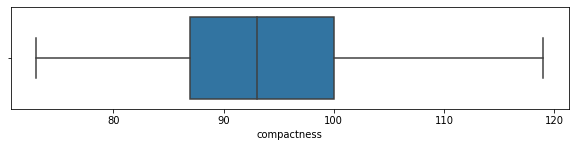

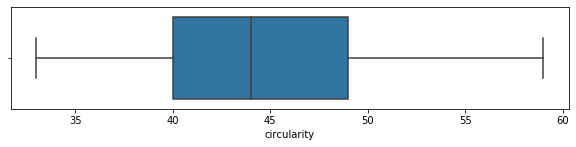

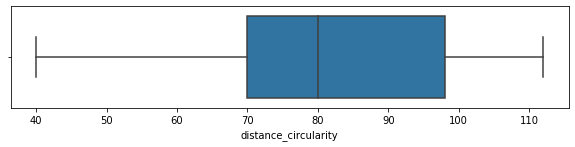

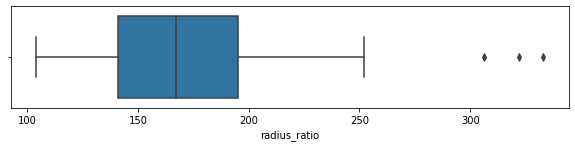

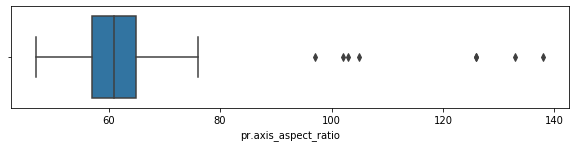

...

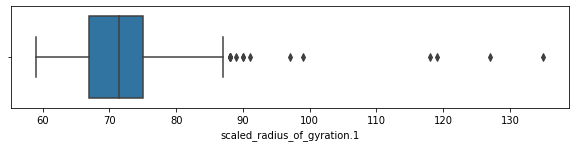

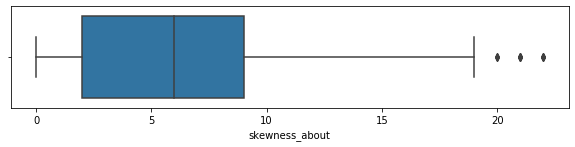

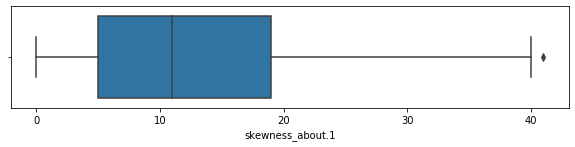

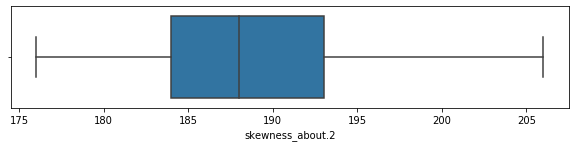

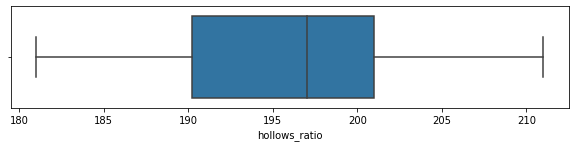

In [10]:
### Checking for any outlier Presence
cols=df.columns
j=1
for i in cols:
    if df[i].dtypes!='object':
        plt.figure(figsize=(10,40))
        plt.subplot(18,1,j)
        sns.boxplot(df[i])
        j+=1

In [11]:
### Printing the total no of Outlier Presence Columns
outliers=['radius_ratio','pr.axis_aspect_ratio','max.length_aspect_ratio','scaled_variance','scaled_variance.1','scaled_radius_of_gyration.1','skewness_about','skewness_about.1']
print(len(outliers))

8


In [12]:
### Taking Backup
df_bkp=df.copy(deep=True)

In [13]:
### Removing the Outlier from each Columns
for i in outliers:
    print(f'Removing the Outliers in {i} ...')
    IQvalue1=df[i].quantile(0.75)+(1.5*(df[i].quantile(0.75)-df[i].quantile(0.25)))
    IQvalue2=df[i].quantile(0.25)-(1.5*(df[i].quantile(0.75)-df[i].quantile(0.25)))
    median=df[i].median()
    for j in df[i]:
        if j > IQvalue1:
            df[i]=df[i].replace(j,median)
        if j < IQvalue2:
            df[i]=df[i].replace(j,median)
print('\nOutlier Removal is Done Successfully')

Removing the Outliers in radius_ratio ...
Removing the Outliers in pr.axis_aspect_ratio ...
Removing the Outliers in max.length_aspect_ratio ...
Removing the Outliers in scaled_variance ...
Removing the Outliers in scaled_variance.1 ...
Removing the Outliers in scaled_radius_of_gyration.1 ...
Removing the Outliers in skewness_about ...
Removing the Outliers in skewness_about.1 ...

Outlier Removal is Done Successfully


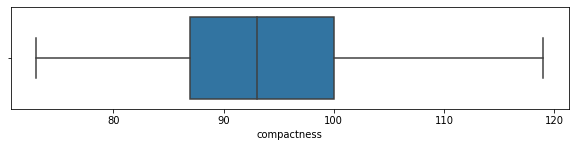

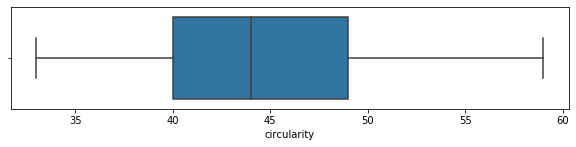

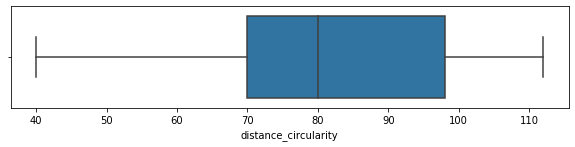

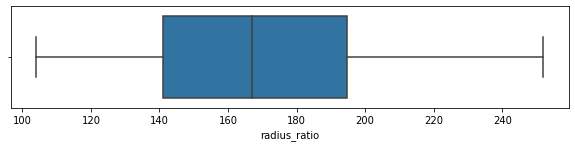

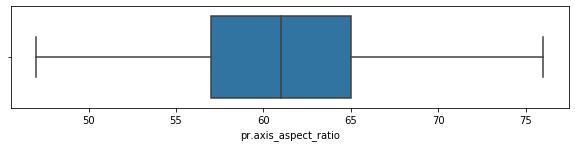

...

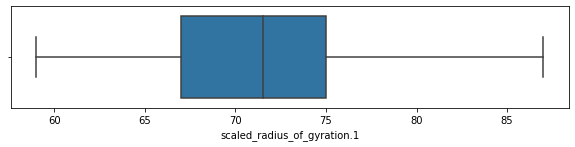

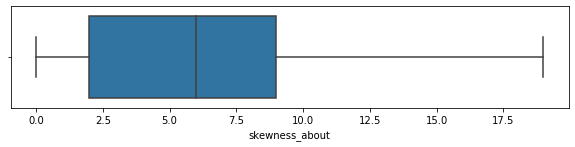

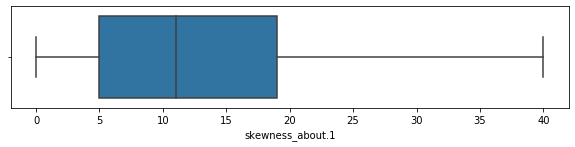

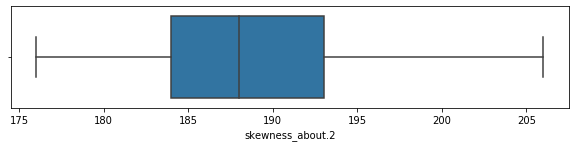

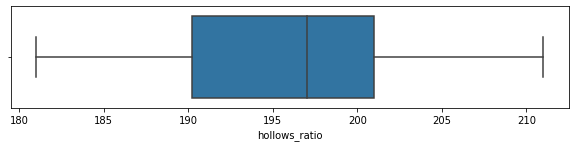

In [14]:
### Re-Checking for any outlier Presence
cols=df.columns
j=1
for i in cols:
    if df[i].dtypes!='object':
        plt.figure(figsize=(10,40))
        plt.subplot(18,1,j)
        sns.boxplot(df[i])
        j+=1

In [15]:
### Dimension Names before Renaming it.
df.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

In [16]:
### Renaming the column names 
df.rename(columns={'distance_circularity':'dist_circularity',
                   'pr.axis_aspect_ratio':'pr_ratio',
                   'max.length_aspect_ratio':'max_ration',
                   'pr.axis_rectangularity':'pr_rectangularity',
                   'max.length_rectangularity':'max_rectangularity',
                   'scaled_variance':'sv',
                   'scaled_variance.1':'sv1',
                   'scaled_radius_of_gyration':'sg',
                   'scaled_radius_of_gyration.1':'sg1',
                   'skewness_about':'sa',
                   'skewness_about.1':'sa1',
                   'skewness_about.2':'sa2'
                  },inplace=True)

In [17]:
### Displaying the unique values of Target Variable
print(df['class'].unique())

['van' 'car' 'bus']


In [18]:
### Checking the data balance ratio
df['class'].value_counts()

car    429
bus    218
van    199
Name: class, dtype: int64

#### As seen, Data is imbalanced 

###   

In [19]:
### Performing ONE HOT ENCODING for datatype change
k={'class':{'car':'3','bus':'2','van':'1'}}
df.replace(k,inplace=True)

In [20]:
### Changing the datatype of the target variable
df['class']=df['class'].astype('int32')

In [21]:
### Checking the correlation effect on the dependent variable
a=df.corr().T
corr_tgt=pd.DataFrame(a)
corr_tgt['class']

compactness           0.297774
circularity           0.251281
dist_circularity      0.428523
radius_ratio          0.444101
pr_ratio              0.062981
max_ration            0.167375
scatter_ratio         0.463566
elongatedness        -0.483027
pr_rectangularity     0.444586
max_rectangularity    0.140152
sv                    0.420329
sv1                   0.451600
sg                    0.247735
sg1                  -0.181826
sa                    0.057898
sa1                   0.269542
sa2                   0.054732
hollows_ratio         0.142852
class                 1.000000
Name: class, dtype: float64

In [22]:
a

,compactness,circularity,dist_circularity,radius_ratio,pr_ratio,max_ration,scatter_ratio,elongatedness,pr_rectangularity,max_rectangularity,sv,sv1,sg,sg1,sa,sa1,sa2,hollows_ratio,class
compactness,1.000000,0.684887,0.789928,0.721925,0.192864,0.499928,0.812620,-0.788750,0.813694,0.676143,0.769871,0.806170,0.585243,-0.246681,0.197308,0.156348,0.298537,0.365552,0.297774
circularity,0.684887,1.000000,0.792320,0.638280,0.203253,0.560470,0.847938,-0.821472,0.843400,0.961318,0.802768,0.827462,0.925816,0.068745,0.136351,-0.009666,-0.104426,0.046351,0.251281
dist_circularity,0.789928,0.792320,1.000000,0.794222,0.244332,0.666809,0.905076,-0.911307,0.893025,0.774527,0.869584,0.883943,0.705771,-0.229353,0.099107,0.262345,0.146098,0.332732,0.428523
radius_ratio,0.721925,0.638280,0.794222,1.000000,0.650554,0.463958,0.769941,-0.825392,0.744139,0.579468,0.786183,0.760257,0.550774,-0.390459,0.035755,0.179601,0.405849,0.491758,0.444101
pr_ratio,0.192864,0.203253,0.244332,0.650554,1.000000,0.150295,0.194195,-0.298144,0.163047,0.147592,0.207101,0.196401,0.148591,-0.321070,-0.056030,-0.021088,0.400882,0.415734,0.062981
max_ration,0.499928,0.560470,0.666809,0.463958,0.150295,1.000000,0.490759,-0.504181,0.487931,0.642713,0.401391,0.463249,0.397397,-0.335444,0.081898,0.141664,0.083794,0.413174,0.167375
scatter_ratio,0.812620,0.847938,0.905076,0.769941,0.194195,0.490759,1.000000,-0.971601,0.989751,0.809083,0.960883,0.980447,0.799875,0.011314,0.064242,0.211647,0.005628,0.118817,0.463566
elongatedness,-0.788750,-0.821472,-0.911307,-0.825392,-0.298144,-0.504181,-0.971601,1.000000,-0.948996,-0.775854,-0.947644,-0.948851,-0.766314,0.078391,-0.046943,-0.183642,-0.115126,-0.216905,-0.483027
pr_rectangularity,0.813694,0.843400,0.893025,0.744139,0.163047,0.487931,0.989751,-0.948996,1.000000,0.810934,0.947329,0.973606,0.796690,0.027545,0.073127,0.213801,-0.018649,0.099286,0.444586
max_rectangularity,0.676143,0.961318,0.774527,0.579468,0.147592,0.642713,0.809083,-0.775854,0.810934,1.000000,0.750222,0.789632,0.866450,0.053856,0.130702,0.004129,-0.103948,0.076770,0.140152


### Performing EDA 

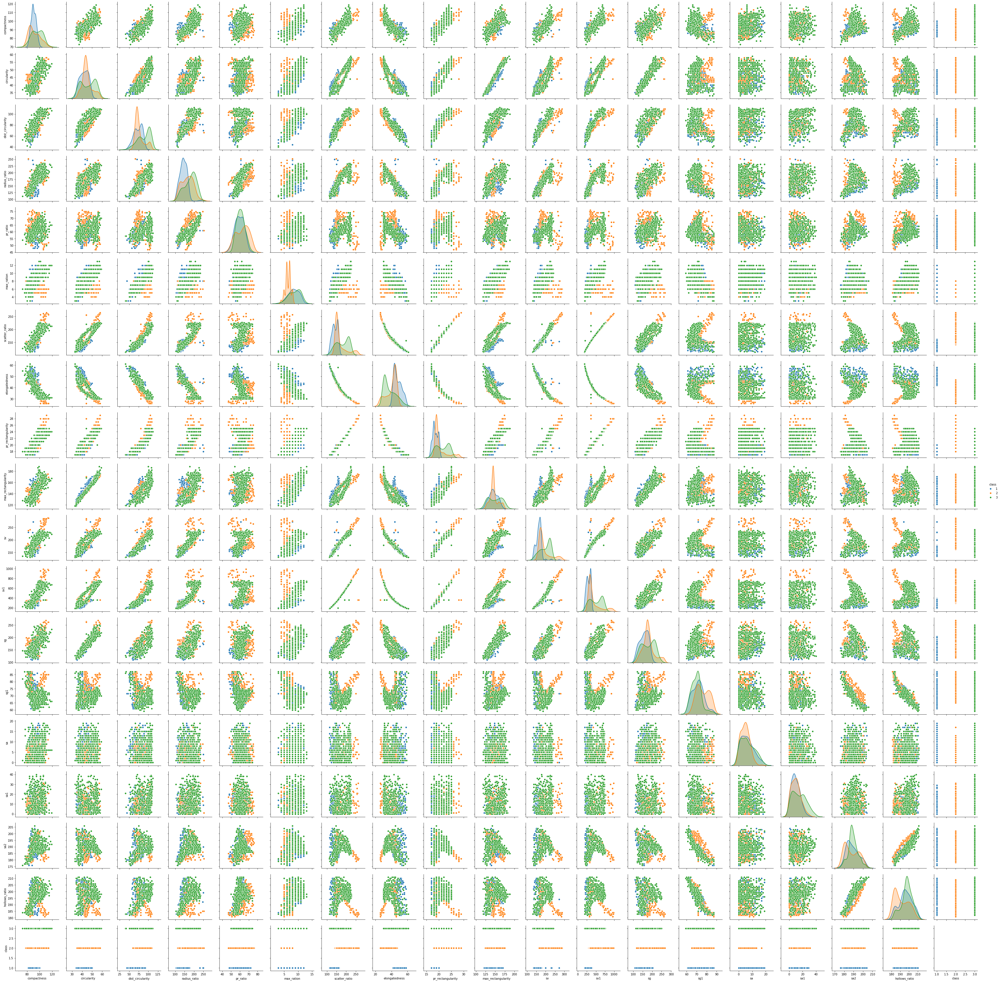

In [23]:
sns.pairplot(df,hue='class')

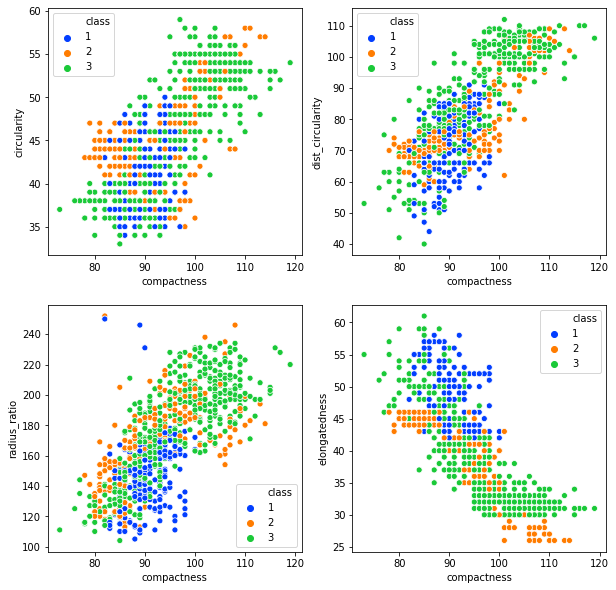

In [24]:
### COMPACTNESS
a=sns.color_palette("bright",3)
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
sns.scatterplot(df['compactness'],df['circularity'],hue=df['class'],palette=a)
plt.subplot(2,2,2)
sns.scatterplot(df['compactness'],df['dist_circularity'],hue=df['class'],palette=a)
plt.subplot(2,2,3)
sns.scatterplot(x='compactness',y='radius_ratio',hue='class',data=df,palette=a)
plt.subplot(2,2,4)
sns.scatterplot(x='compactness',y='elongatedness',hue='class',data=df,palette=a)

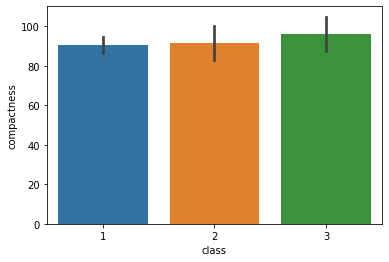

In [25]:
sns.barplot(y='compactness',x='class',data=df,ci='sd')

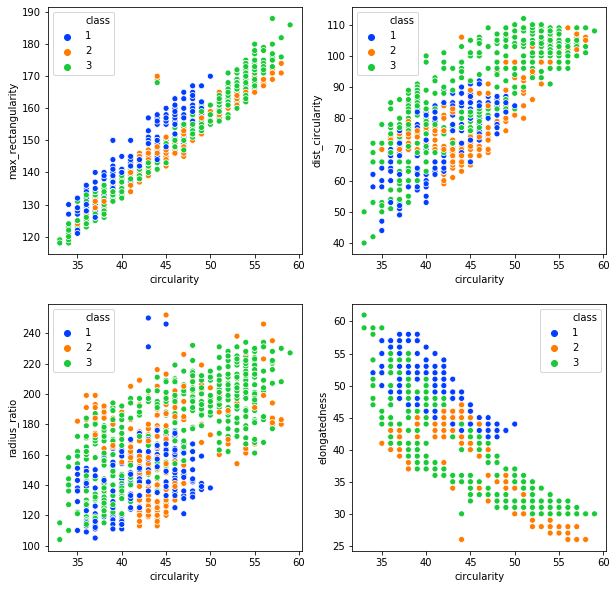

In [26]:
### CIRCULARITY 

a=sns.color_palette("bright",3)
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
sns.scatterplot(df['circularity'],df['max_rectangularity'],hue=df['class'],palette=a)
plt.subplot(2,2,2)
sns.scatterplot(df['circularity'],df['dist_circularity'],hue=df['class'],palette=a)
plt.subplot(2,2,3)
sns.scatterplot(x='circularity',y='radius_ratio',hue='class',data=df,palette=a)
plt.subplot(2,2,4)
sns.scatterplot(x='circularity',y='elongatedness',hue='class',data=df,palette=a)

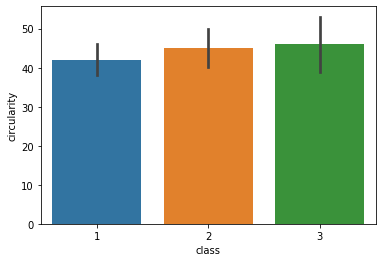

In [27]:
sns.barplot(x='class',y='circularity',data=df,ci='sd')

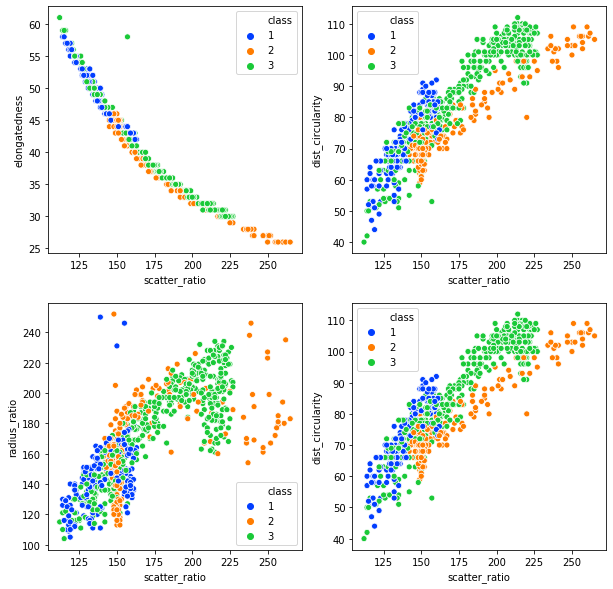

In [28]:
a=sns.color_palette("bright",3)
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
sns.scatterplot(df['scatter_ratio'],df['elongatedness'],hue=df['class'],palette=a)
plt.subplot(2,2,2)
sns.scatterplot(df['scatter_ratio'],df['dist_circularity'],hue=df['class'],palette=a)
plt.subplot(2,2,3)
sns.scatterplot(x='scatter_ratio',y='radius_ratio',hue='class',data=df,palette=a)
plt.subplot(2,2,4)
sns.scatterplot(x='scatter_ratio',y='dist_circularity',hue='class',data=df,palette=a)

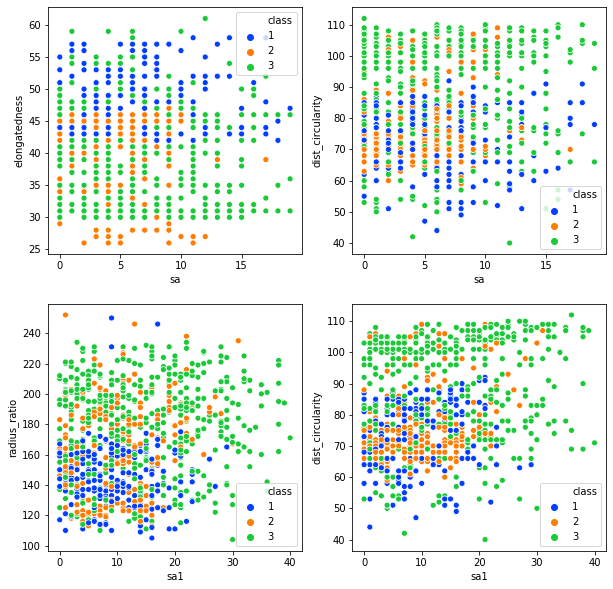

In [29]:
### SKEWNESS ABOUT

a=sns.color_palette("bright",3)
plt.figure(figsize=(10,10))
plt.subplot(2,2,1)
sns.scatterplot(df['sa'],df['elongatedness'],hue=df['class'],palette=a)
plt.subplot(2,2,2)
sns.scatterplot(df['sa'],df['dist_circularity'],hue=df['class'],palette=a)
plt.subplot(2,2,3)
sns.scatterplot(x='sa1',y='radius_ratio',hue='class',data=df,palette=a)
plt.subplot(2,2,4)
sns.scatterplot(x='sa1',y='dist_circularity',hue='class',data=df,palette=a)

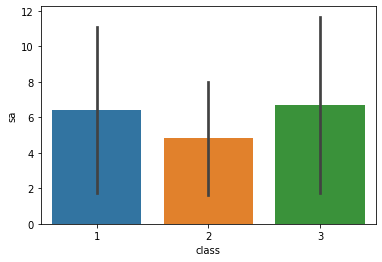

In [30]:
sns.barplot(x='class',y='sa',data=df,ci='sd')

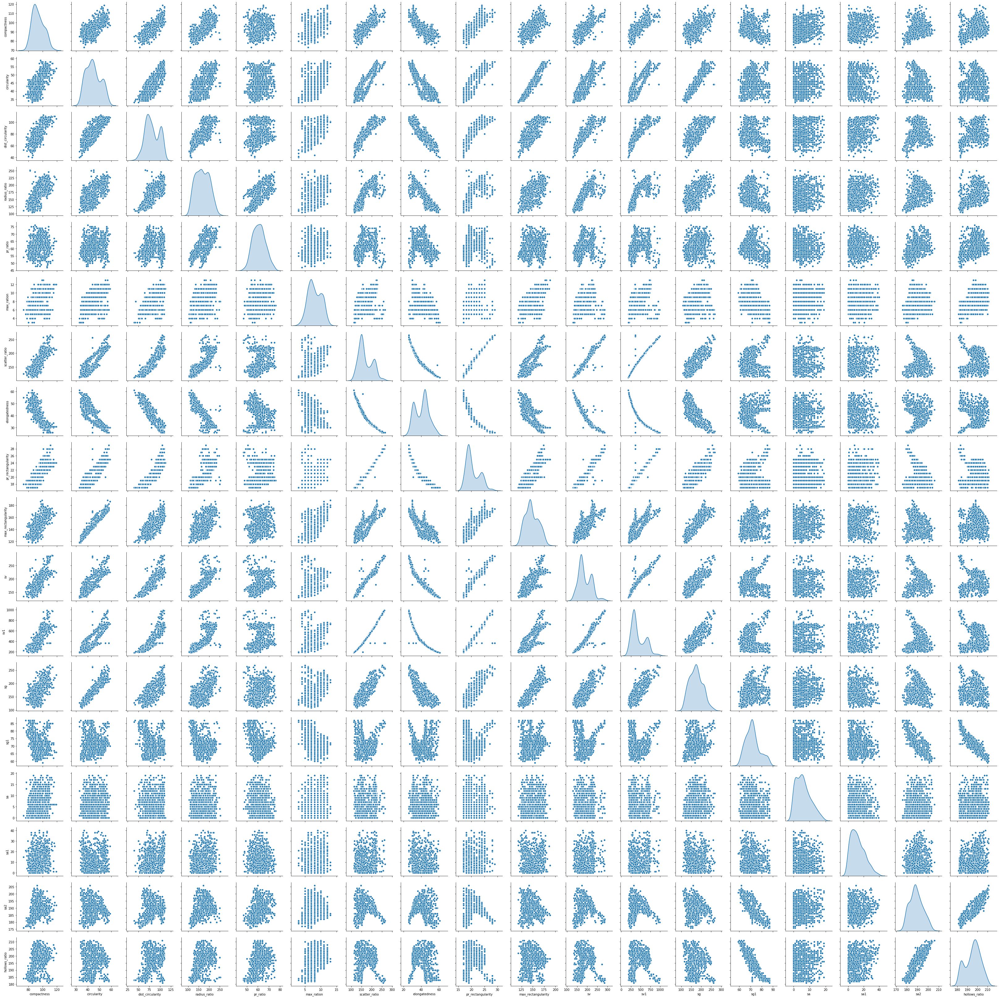

In [31]:
### Pairplotting the dataframe
df_corr=df.drop('class',axis=1)
sns.pairplot(df_corr,diag_kind='kde')

### EDA Summary Points

- From Pairplot we could see most of independent variables are being both positively and negatively correlated each other.
- Most of attributes have nice bell shaped curve.
- We have maximum of two gaussians , which imply 2 clusters.
- Since PCA is required to minimize the correlation effect and to reduce the dimensions, Initially we will check performance without PCA and try with PCA and analyse the scores

### Splitting the dataset into TEST and TRAIN sets

In [32]:
X=df.drop('class',axis=1)
y=df['class']

In [33]:
x_train,x_test,y_train,y_test=train_test_split(X,y,test_size=.3,random_state=3)
print(x_train.shape)
print(x_test.shape)
print(y_train.shape)
print(y_test.shape)

(592, 18)
(254, 18)
(592,)
(254,)


#### Performing SVC without Scaling

In [34]:

svm=SVC(kernel='rbf',random_state=3)
svm.fit(x_train,y_train)
y_pred=svm.predict(x_test)
print('Training score :',svm.score(x_train,y_train))
print('Test score     :',svm.score(x_test,y_test))
print()
print('Accuracy Score :',np.round(accuracy_score(y_test,y_pred)*100),'%')

Training score : 1.0
Test score     : 0.484251968503937

Accuracy Score : 48.0 %


In [35]:
print('Classification Report :')
print(classification_report(y_test,y_pred))

Classification Report :
              precision    recall  f1-score   support

           1       0.00      0.00      0.00        60
           2       0.00      0.00      0.00        71
           3       0.48      1.00      0.65       123

    accuracy                           0.48       254
   macro avg       0.16      0.33      0.22       254
weighted avg       0.23      0.48      0.32       254



Confusion Matrix :


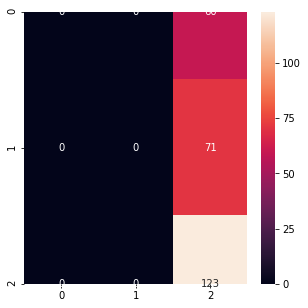

In [36]:
print('Confusion Matrix :')
cm=confusion_matrix(y_test,y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True,fmt='1')

### Performing SVC with Scaling

In [37]:
### Standardizing the data
sc=StandardScaler()
X_scaled=sc.fit_transform(X)
X_train,X_test,y_train,y_test=train_test_split(X_scaled,y,test_size=.3,random_state=3)

In [38]:
svm=SVC(kernel='rbf',random_state=3)
svm.fit(X_train,y_train)
y_pred=svm.predict(X_test)
print('Training score :',svm.score(X_train,y_train))
print('Test score     :',svm.score(X_test,y_test))
print()
print('Accuracy Score :',np.round(accuracy_score(y_test,y_pred)*100),'%')

Training score : 0.9712837837837838
Test score     : 0.9606299212598425

Accuracy Score : 96.0 %


In [39]:
print('Classification Report :')
print(classification_report(y_test,y_pred))

Classification Report :
              precision    recall  f1-score   support

           1       0.95      0.95      0.95        60
           2       0.96      0.99      0.97        71
           3       0.97      0.95      0.96       123

    accuracy                           0.96       254
   macro avg       0.96      0.96      0.96       254
weighted avg       0.96      0.96      0.96       254



Confusion Matrix :


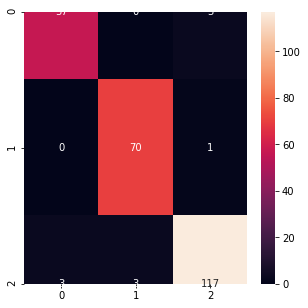

In [40]:
print('Confusion Matrix :')
cm=confusion_matrix(y_test,y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True,fmt='1')

- Thus without scaling performance is low and with scaling the performance is increased.

### Performing K-Fold Cross Validation

In [41]:
score_1=cross_val_score(svm,X_scaled,y,cv=10)
print('Isolated scores of each fold ')
for a,i in enumerate(score_1):
    print('score ',a+1,':',i)
print()
print(" Average Accuracy: %0.2f (+/- %0.2f)" % (score_1.mean(), score_1.std() * 2 ))


Isolated scores of each fold 
score  1 : 0.9176470588235294
score  2 : 0.9647058823529412
score  3 : 0.9647058823529412
score  4 : 0.9529411764705882
score  5 : 0.9882352941176471
score  6 : 0.9764705882352941
score  7 : 0.9294117647058824
score  8 : 0.9529411764705882
score  9 : 0.9642857142857143
score  10 : 0.9634146341463414

 Average Accuracy: 0.96 (+/- 0.04)


## Implementing PCA 

### Method 1 (Implementing PCA by Conceptual method )

In [42]:
### Covariance Matrix Implementation
cov_mat=np.cov(X_scaled.T)
print('Covariance Matrix')
print(cov_mat)

Covariance Matrix
[[ 1.00118343  0.68569786  0.79086299  0.72277977  0.1930925   0.50051942
   0.81358214 -0.78968322  0.81465658  0.67694334  0.77078163  0.80712401
   0.58593517 -0.24697246  0.19754181  0.1565327   0.29889034  0.36598446]
 [ 0.68569786  1.00118343  0.79325751  0.63903532  0.20349327  0.5611334
   0.8489411  -0.82244387  0.84439802  0.96245572  0.80371846  0.82844154
   0.92691166  0.06882659  0.13651201 -0.00967793 -0.10455005  0.04640562]
 [ 0.79086299  0.79325751  1.00118343  0.79516215  0.24462154  0.66759792
   0.90614687 -0.9123854   0.89408198  0.77544391  0.87061349  0.88498924
   0.70660663 -0.22962442  0.09922417  0.26265581  0.14627113  0.33312625]
 [ 0.72277977  0.63903532  0.79516215  1.00118343  0.65132393  0.46450748
   0.77085211 -0.82636872  0.74502008  0.58015378  0.78711387  0.76115704
   0.55142559 -0.39092105  0.03579728  0.17981316  0.40632957  0.49234013]
 [ 0.1930925   0.20349327  0.24462154  0.65132393  1.00118343  0.15047265
   0.19442484 -0.

In [43]:
### Eigen value and Eigen Vector Implementation
eigenvalues,eigenvectors=np.linalg.eig(cov_mat)
print('Eigen Vectors \n%s', eigenvectors)
print('\n Eigen Values \n%s', eigenvalues)

Eigen Vectors 
%s [[-2.72502890e-01 -8.70435783e-02  3.81852075e-02  1.38675013e-01
  -1.37101466e-01  2.63611383e-01  2.02717114e-01 -7.58796410e-01
   3.66685918e-01  1.60045219e-01  8.40252779e-02  2.14645175e-02
  -1.87350749e-02  6.89082276e-02  4.26105276e-02  9.97784975e-02
  -8.22590084e-02 -3.30366937e-02]
 [-2.87254690e-01  1.31621757e-01  2.01146908e-01 -3.80554832e-02
   1.38995553e-01 -7.13474241e-02 -3.92275358e-01 -6.76034223e-02
   5.53261885e-02 -1.82323962e-01 -3.65229874e-02  1.47247511e-01
  -4.89102355e-02  5.90534770e-02 -6.74107885e-01  1.63466948e-01
  -2.59100771e-01  2.48832011e-01]
 [-3.02421105e-01 -4.61430061e-02 -6.34621085e-02  1.08954287e-01
   8.00174278e-02 -1.69006151e-02  1.63371282e-01  2.77371950e-01
   7.46784853e-02  2.73033778e-01  4.68505530e-01  6.52730855e-01
   4.74162132e-03 -1.62108150e-01 -4.99754439e-04 -6.36582307e-02
   1.20629778e-01  9.80561531e-02]
 [-2.69713545e-01 -1.97931263e-01 -5.62851689e-02 -2.54355087e-01
  -1.33744367e-01 -

In [44]:
### Pairing and sorting in Descending order
eig_pairs = [(eigenvalues[index], eigenvectors[:,index]) for index in range(len(eigenvalues))]
eig_pairs.sort(reverse=True)

In [45]:
# Extract the descending ordered eigenvalues and eigenvectors
eigvalues_sorted = [eig_pairs[index][0] for index in range(len(eigenvalues))]
eigvectors_sorted = [eig_pairs[index][1] for index in range(len(eigenvalues))]

In [46]:
print('Eigenvalues in descending order: \n%s' %eigvalues_sorted)

Eigenvalues in descending order: 
[9.749402689379597, 3.350719119412978, 1.1923815452731639, 1.1338191632147838, 0.8839973120036095, 0.6662657454310769, 0.31815090958438486, 0.2281791421155407, 0.13101859512585473, 0.07986191082036508, 0.07339794782509106, 0.06461626687535525, 0.04014486457709953, 0.032275847766898305, 0.02939364075031221, 0.022700525706219703, 0.019813676080863922, 0.0051628732047457404]


In [47]:
tot = sum(eigenvalues)
var_explained = [(i / tot) for i in eigvalues_sorted] 
print('sum of variance :',sum(var_explained))
print()
print('Variance Explained :\n',var_explained)

### Cumulative variance Calculation
cum_var_exp = np.cumsum(var_explained)
print('\nCumulative Variace :',cum_var_exp)

sum of variance : 0.9999999999999999

Variance Explained :
 [0.5409932540403042, 0.18593102547307355, 0.06616511726791585, 0.06291549730210741, 0.0490529109957348, 0.036971010959368236, 0.017654158037746583, 0.0126616348231962, 0.007270207045005724, 0.004431528411032863, 0.004072843834528625, 0.003585549350517149, 0.0022276340010276515, 0.001790983147033691, 0.001631049805228119, 0.0012596496074176278, 0.0010994586477758078, 0.0002864872509856939]

Cumulative Variace : [0.54099325 0.72692428 0.7930894  0.85600489 0.90505781 0.94202882
 0.95968297 0.97234461 0.97961482 0.98404634 0.98811919 0.99170474
 0.99393237 0.99572335 0.9973544  0.99861405 0.99971351 1.        ]


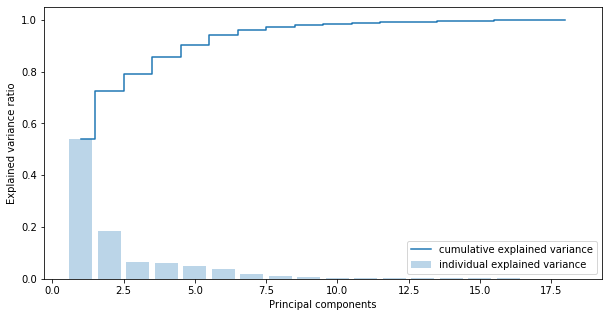

In [48]:
### Plotting the PCA vs Variances
plt.figure(figsize=(10,5))
plt.bar(range(1,19), var_explained, alpha=0.3, label='individual explained variance')
plt.step(range(1,19),cum_var_exp,where='mid', label='cumulative explained variance')
plt.ylabel('Explained variance ratio')
plt.xlabel('Principal components')
plt.legend(loc = 'best')
plt.show()

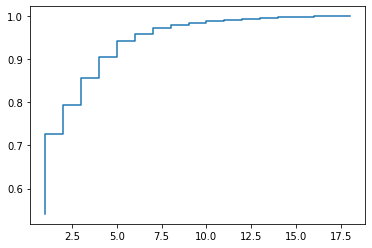

In [49]:
plt.step(range(1,19),cum_var_exp,where='pre', label='cumulative explained variance')

#### Thus from above graph and Cumlative  variance data, I am chosing 7 Components which explains 95 % of Data.

In [50]:
P_reduce = np.array(eigvectors_sorted[0:7]) 

In [51]:
X_std_7D = np.dot(X_scaled,P_reduce.T)   # projecting original data into principal component dimensions

In [52]:
Proj_data_df = pd.DataFrame(X_std_7D) 

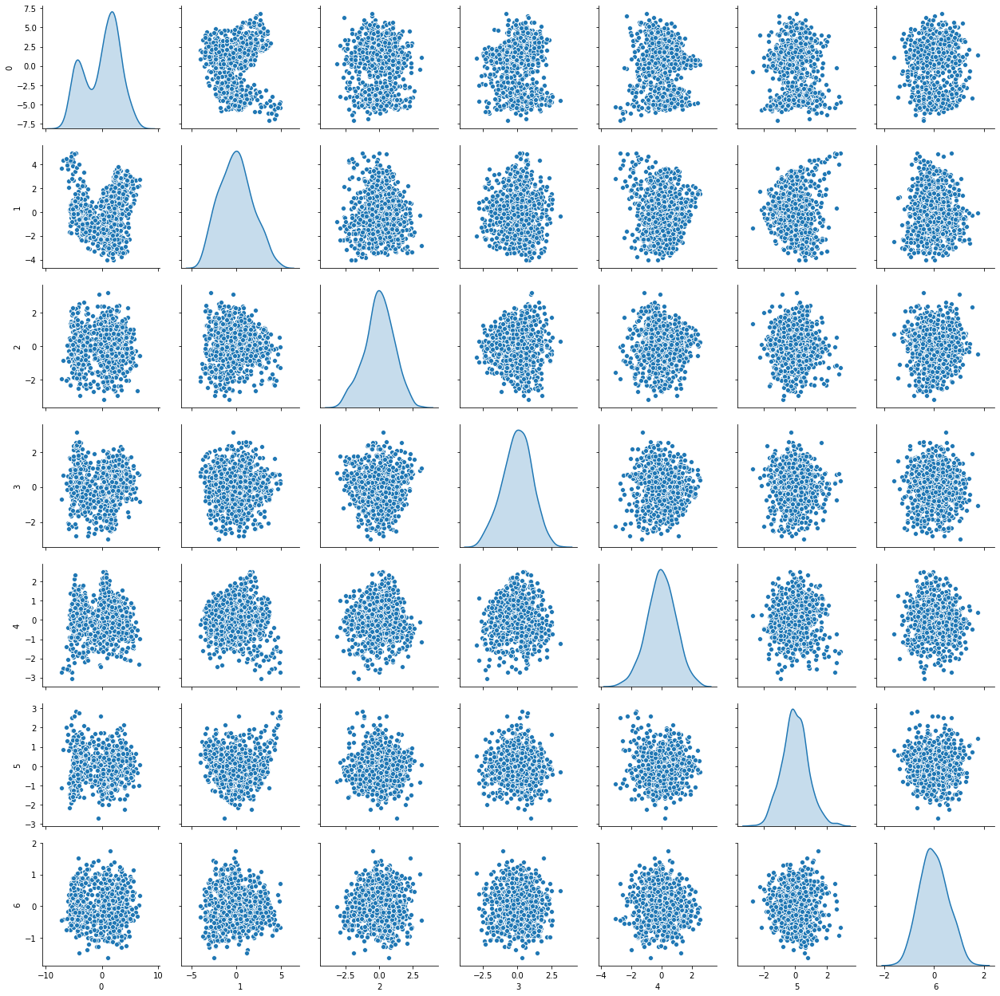

In [53]:
### Pairplotting the PCA Components
sns.pairplot(Proj_data_df,diag_kind='kde')

- As we could see the correlation between each componets is cloud shaped (less correlation effect).

In [54]:
### Checking the correlation
Proj_data_df.corr().T

,0,1,2,3,4,5,6
0,1.000000e+00,-2.244519e-16,-4.494738e-16,-1.605213e-16,6.314446e-16,-4.445796e-16,-6.560462e-16
1,-2.244519e-16,1.000000e+00,2.422882e-16,-1.598501e-16,8.765879e-17,2.646837e-16,3.194686e-16
2,-4.494738e-16,2.422882e-16,1.000000e+00,-9.294155e-17,8.417464e-17,-5.616259e-16,-3.861072e-16
3,-1.605213e-16,-1.598501e-16,-9.294155e-17,1.000000e+00,5.609150e-16,1.263400e-15,4.378452e-16
4,6.314446e-16,8.765879e-17,8.417464e-17,5.609150e-16,1.000000e+00,3.469586e-16,4.361926e-16
5,-4.445796e-16,2.646837e-16,-5.616259e-16,1.263400e-15,3.469586e-16,1.000000e+00,-3.477273e-16
6,-6.560462e-16,3.194686e-16,-3.861072e-16,4.378452e-16,4.361926e-16,-3.477273e-16,1.000000e+00


In [55]:
x_train1,x_test1,y_train1,y_test1=train_test_split(Proj_data_df,y,test_size=.3,random_state=3)
print(x_train1.shape)
print(x_test1.shape)
print(y_train1.shape)
print(y_test1.shape)

(592, 7)
(254, 7)
(592,)
(254,)


In [56]:
svm=SVC(random_state=3)
svm.fit(x_train1,y_train1)
y_pred=svm.predict(x_test1)
print('Training score :',svm.score(x_train1,y_train1))
print('Test score     :',svm.score(x_test1,y_test1))
print()
print('Accuracy Score :',np.round(accuracy_score(y_test1,y_pred)*100),'%')

Training score : 0.9628378378378378
Test score     : 0.9330708661417323

Accuracy Score : 93.0 %


In [57]:
print('Classification Report :')
print(classification_report(y_test1,y_pred))

Classification Report :
              precision    recall  f1-score   support

           1       0.90      0.87      0.88        60
           2       0.95      1.00      0.97        71
           3       0.94      0.93      0.93       123

    accuracy                           0.93       254
   macro avg       0.93      0.93      0.93       254
weighted avg       0.93      0.93      0.93       254



Confusion Matrix :


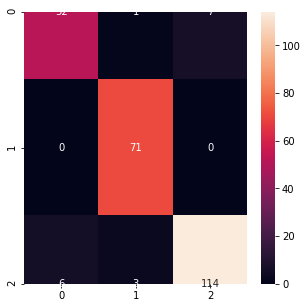

In [58]:
print('Confusion Matrix :')
cm=confusion_matrix(y_test1,y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True,fmt='1')

In [59]:
score_2=cross_val_score(svm,Proj_data_df,y,cv=10)
print('Isolated scores of each fold ')
for a,i in enumerate(score_2):
    print('Fold ',a+1,':',i)
print()
print("Accuracy: %0.2f (+/- %0.2f)" % (score_2.mean(), score_2.std() * 2 ))

Isolated scores of each fold 
Fold  1 : 0.9058823529411765
Fold  2 : 0.9529411764705882
Fold  3 : 0.8941176470588236
Fold  4 : 0.9411764705882353
Fold  5 : 0.9176470588235294
Fold  6 : 0.9764705882352941
Fold  7 : 0.9058823529411765
Fold  8 : 0.9529411764705882
Fold  9 : 0.9404761904761905
Fold  10 : 0.8902439024390244

Accuracy: 0.93 (+/- 0.06)


### Score summary :

In [60]:
print('SVM Model score without PCA is %.2f percent with %.2f S.D and after Implementing PCA is %.2f percent with %.2f S.D' %(score_1.mean()*100 ,score_1.std()*2,score_2.mean()*100,score_2.std()*2))

SVM Model score without PCA is 95.75 percent with 0.04 S.D and after Implementing PCA is 92.78 percent with 0.06 S.D


- Before there was high multicolinearity.After Implementing PCA, We could see that Multicolinearity is reduced.
- Without scaling , It showed that Training score was overfitting.
- After Scaling, With 18 Dimension we got accuracy of 96 % with 0.04 standard deviation
- After Implementing PCA, It is noticed that No Overfitting took place.
- After PCA implementation,With 7 Dimensions we got good Test score peformance as 96 % with 0.06 standard deviation.
- Previously 18 Dimension were used.With help of PCA ,Dimensionality is reduced to 7.

## Method 2 (  PCA  Implementation using Sklearn API )

In [61]:
### Implemnting PCA using Sklearn api
pc=PCA(n_components=7)
pc.fit(X_scaled)
print(pc.components_)
print(pc.explained_variance_ratio_)
pc_7D=pc.transform(X_scaled)

[[ 0.27250289  0.28725469  0.30242111  0.26971354  0.09786073  0.19520014
   0.31052393 -0.3090069   0.307287    0.27815416  0.29976509  0.30553237
   0.26323762 -0.04193594  0.03608321  0.05872048  0.03801314  0.08474   ]
 [-0.08704358  0.13162176 -0.04614301 -0.19793126 -0.25783995 -0.10804563
   0.07528535 -0.01322994  0.0875602   0.12215424  0.07726575  0.07150302
   0.21058205  0.50362158 -0.01576632 -0.09274624 -0.50162122 -0.50761211]
 [-0.03818521 -0.20114691  0.06346211  0.05628517 -0.06199275 -0.14895782
   0.10904283 -0.09085269  0.1060705  -0.21368469  0.1445998   0.11034374
  -0.20287019  0.07386402 -0.55917399  0.6706805  -0.06224071 -0.04170535]
 [ 0.13867501 -0.03805548  0.10895429 -0.25435509 -0.61276572  0.27867816
   0.00539295  0.06521486  0.03089915  0.04146747 -0.06400509 -0.00219687
  -0.08553965 -0.11539962  0.47370331  0.42842603 -0.0274096   0.09603749]
 [ 0.13710147 -0.13899555 -0.08001743  0.13374437  0.12360146 -0.63489336
   0.08555745 -0.07907344  0.08164

In [62]:
### Converting into Dataframe
pc_7D_df=pd.DataFrame(pc_7D)

In [63]:
### Printing the shape of PCA df
pc_7D_df.shape

(846, 7)

In [64]:
### Splitting the dataset
x_train2,x_test2,y_train2,y_test2=train_test_split(pc_7D_df,y,test_size=.3,random_state=3)
print(x_train2.shape)
print(x_test2.shape)
print(y_train2.shape)
print(y_test2.shape)

(592, 7)
(254, 7)
(592,)
(254,)


In [65]:
### Implemting SVC with PCA
svm=SVC(kernel='rbf',random_state=3)
svm.fit(x_train2,y_train2)
y_pred=svm.predict(x_test2)
print('Training score :',svm.score(x_train2,y_train2))
print('Test score     :',svm.score(x_test2,y_test2))
print()
print('Accuracy Score :',np.round(accuracy_score(y_test2,y_pred)*100),'%')

Training score : 0.9628378378378378
Test score     : 0.9330708661417323

Accuracy Score : 93.0 %


Confusion Matrix :


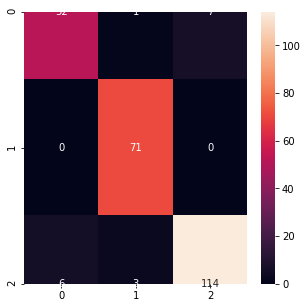

In [66]:
print('Confusion Matrix :')
cm=confusion_matrix(y_test2,y_pred)
plt.figure(figsize=(5,5))
sns.heatmap(cm,annot=True,fmt='1')

- Thus both methods of PCA implementation gives same set of results 

### Comparing  With and Without Implementing PCA on Support Vector Classifier

|Before PCA  | After PCA
| --- | -- |
|High multicolinearity|Low multicolinearity|
| | |
|18 Dimensions were used|Only 7 Dimensions are used
| | |
|whole dataset is used| 95% of Data Information is used|
| | |
|Avg cross val score is 96 %|Avg cross val score is 93 % |
| | |
|Test Score Accuracy is 96 %|Test Score Accuracy is 93 %|
| | |


## CONCLUSION

#### Thus Our model performs well with 96 % accuracy on 18 dimensions and  with PCA it does 93 % accuracy with 7 dimensions. And we  concluded that , We reduced our dimensions with minimal information loss.
